In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu
import folium

#Save updated data to csv
save = True


In [2]:
data = pd.read_csv("Airbnb Listings Bangkok.csv")
data.head(5)


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


==DATA CLEANING==

***Unnamed DATA***
From the data above we could see that there's a Unnamed: 0 data that serve no purpose, therefore i will remove/drop that data.

In [3]:
#drop Unnamed: 0
data.drop('Unnamed: 0', axis=1, inplace=True)

In [4]:
#show the null values
data.isnull().sum()

id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5790
reviews_per_month                 5790
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

From The data above we could see a numbers of null values from name, host_name, last_review, and reviews_per_month

*** NAME ***

From seing the null in the name section we could see that the amount of null isn't much therefore we could make some options for what we could do to that data
1. Delete the data [because the null data is small or only 0.05% of the rest of the data]
2. Fill the data [This will depends on the data corrlation, if the data have no corrlation and not that important to the statical data we could assumed the data. ]

From the head data above, i observe that the data for name is the name/ spesification of the room name that have no corrlation and not that important to  the statical data. Therefore we could delete or fill the data base on assumption, for this data i chosed that i will fill the data base on assumption that will be "Room for rent".



In [5]:
#percentage of the null name data from the rest of the data
data[data['name'].isnull()].shape[0]/data.shape[0]*100

0.050460451621042006

In [6]:
data['name'] = data['name'].fillna(data['host_name'] + "'s " + data['room_type'])


*** host_name ***

From the data head above there is 1 host that doesn't have a name or null in this case. from the my standpoint we could call the owner for the name but unfortunatelly there isn't a phone number section therefore i will drop it, because is it too dangerous for a rental place without name.

In [7]:
#droping the host name with a null value
data.dropna(subset=['host_name'], inplace=True)

*** last_review & reviews_per_month ***

From the null value above we could see that both of them have the same amount of null value, and from the example of the head we could see that the last review and review per month are empty because the number of review is equal to 0. To check if this is true i have code below that show if there's a data that have a null last_review with number_of_reviews more than 0, from what we could see there isn't any data that fit that description making my conclusion true.

We have 2 option do to for this data.
1. drop/delete the data [From the data percentage this will not be a good move to take, because the null datas of the last_review is 36.5% of the whole data. Therefore making this option not recomended ]
2. Fill the data [ This option is the one that will be commended because by filling up the data this will not lead to the lost of big data]

Now what should we put to replace the null data, in this case i will put the null data of "last_review" as "No Review".Because there's isn't a date when the place was built in the dataset, if that the case we could put the last_review as that date because after construction there's must be an inspection. 

As for the review_per_month it should be = 0, because it is a numerical value

In [8]:
#null and number of review more than 1
data[data['last_review'].isnull() & (data['number_of_reviews'] > 0)].head()


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm


In [9]:
#The percentage of null for last_review
data[data['last_review'].isnull()].shape[0]/data.shape[0]*100

36.52305557307765

In [10]:
#fill the null of the last_review as "No Review" adn reviews_per_month as 0
data['last_review'] = data['last_review'].fillna('No Review')
data['reviews_per_month'] = data['reviews_per_month'].fillna(0)

In [11]:
data.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64

In [12]:
#To check if there is duplicated in the data 
data.duplicated().sum()

np.int64(0)

this mean there is no duplicated

In [13]:
data[data['price'] == 0].head()

#drop the row with price = 0
data.drop(data[data['price'] == 0].index, inplace=True)

In [14]:
#drop the row with price = 0
data.drop(data[data['price'] == 0].index, inplace=True)

seing it there's only one data, we could delete the data or ask the owner about the price. but because the data is complete we will left it there until further notice from the owner. Therefore we should filter out/ drop that data as we continue

== DATA EXPLAINATION ==

Now that the data doesn't have any more null, let's collect the data statically

In [15]:
data.describe()

# we will see how much air bnb that have 0 price.And we could see from the price distribution that the mean is higher than the median and the standard deviation is higher than the mean that means the data is not normally distributed



,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,1.585200e+04,1.585200e+04,15852.000000,15852.000000,1.585200e+04,15852.000000,15852.000000,15852.000000,15852.000000,15852.000000,15852.000000
mean,1.579596e+17,1.540938e+08,13.745143,100.559898,3.218022e+03,15.294032,16.656195,0.516242,13.891244,244.386450,3.481958
std,2.946148e+17,1.318707e+08,0.043042,0.050910,2.497368e+04,50.818005,40.615488,0.952796,30.271412,125.832546,8.917414
min,2.793400e+04,5.892000e+04,13.527300,100.329550,2.780000e+02,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,2.104509e+07,3.974431e+07,13.720087,100.529685,9.000000e+02,1.000000,0.000000,0.000000,1.000000,138.000000,0.000000
50%,3.503734e+07,1.224094e+08,13.738490,100.561405,1.429000e+03,1.000000,2.000000,0.090000,4.000000,309.000000,0.000000
75%,5.256602e+07,2.390365e+08,13.759493,100.585150,2.429000e+03,7.000000,13.000000,0.670000,13.000000,360.000000,3.000000
max,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,365.000000,325.000000


We could see from the price distribution that the mean is higher than the median and the standard deviation is higher than the mean that means the data is not normally distributed to make the price data normally distributed we could use filter to seperate the luxury and normal price. From the data we could see that the there is an invalid price because the smallest price to stay for a night is 0, we will see how much air bnb that have 0 price.


In [16]:
#test the minimum price with normaltest 

stat, p_val = normaltest(data['price'])

#p value is greater than 0.05 so we can say that the data is normally distributed

#p value is less than 0.05 so we reject the null hypothesis
print(f"p value is {p_val} and beacuse p value is less than 0.05 it means that the probability of the price coming from a normal distribution is extremely low. In other words, the price significantly deviates from normality.")

p value is 0.0 and beacuse p value is less than 0.05 it means that the probability of the price coming from a normal distribution is extremely low. In other words, the price significantly deviates from normality.


<Axes: xlabel='price', ylabel='room_type'>

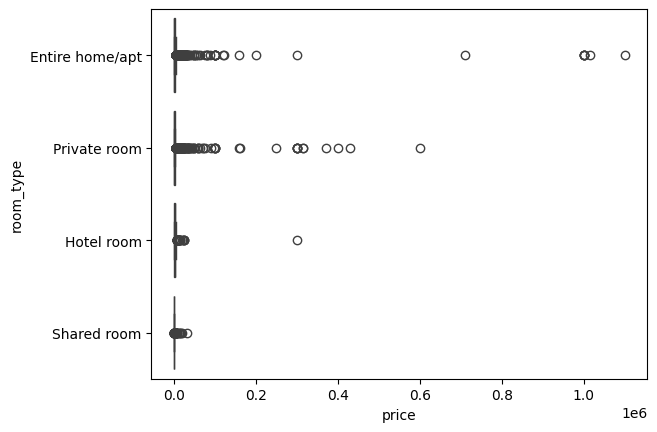

In [17]:
sns.boxplot(x="price", y="room_type", data=data)

We could see that the data distribution is not normal from the plot above by observing the outlier, making the normality test true

<Axes: xlabel='minimum_nights', ylabel='price'>

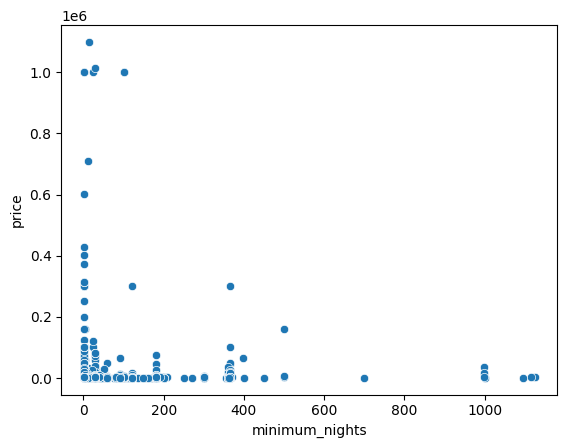

In [18]:
#to check the distribution of price using scatter plot
sns.scatterplot(y="price", x="minimum_nights", data=data)




The data above show the price does not effect the minimum night that should be there, because of the posibility different room type that being rent.

Text(0.5, 1.0, 'Shared room')

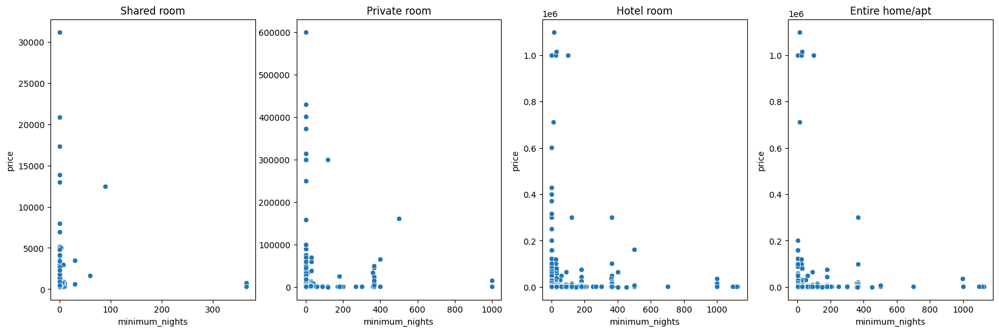

In [19]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 4, 4)
sns.scatterplot(y="price", x="minimum_nights", data=data[data['room_type'] == 'Entire home/apt'])
plt.title("Entire home/apt")

plt.subplot(1, 4, 3)
sns.scatterplot(y="price", x="minimum_nights", data=data[data['room_type'] != 'Hotel room'])
plt.title("Hotel room")

plt.subplot(1, 4, 2)
sns.scatterplot(y="price", x="minimum_nights", data=data[data['room_type'] == 'Private room'])
plt.title("Private room")

plt.subplot(1, 4, 1)
sns.scatterplot(y="price", x="minimum_nights", data=data[data['room_type'] == 'Shared room'])
plt.title("Shared room")



This pattern show that mostly room that are expensive have less minimum_nights because it is common for guest to only try to stay for 1 or 2 days. this will also backfire in price

Text(0.5, 1.0, 'Shared room')

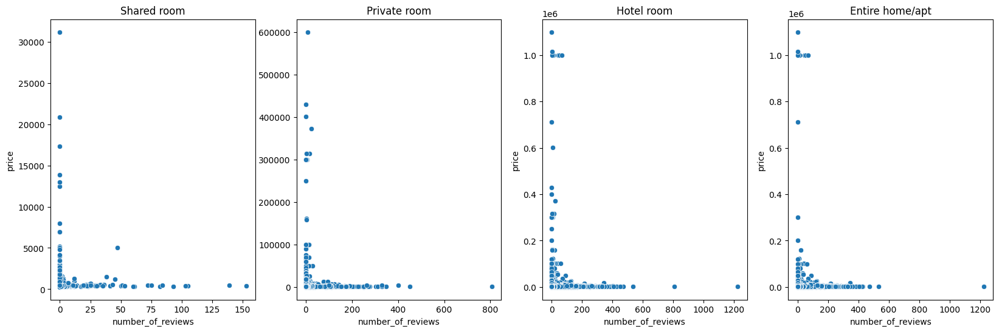

In [20]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 4, 4)
sns.scatterplot(y="price", x="number_of_reviews", data=data[data['room_type'] == 'Entire home/apt'])
plt.title("Entire home/apt")

plt.subplot(1, 4, 3)
sns.scatterplot(y="price", x="number_of_reviews", data=data[data['room_type'] != 'Hotel room'])
plt.title("Hotel room")

plt.subplot(1, 4, 2)
sns.scatterplot(y="price", x="number_of_reviews", data=data[data['room_type'] == 'Private room'])
plt.title("Private room")

plt.subplot(1, 4, 1)
sns.scatterplot(y="price", x="number_of_reviews", data=data[data['room_type'] == 'Shared room'])
plt.title("Shared room")



The graph is similar to the one above, because the price and the number of reviews are correlated, with this data we can say that the price and the number of reviews are highly correlated. Therefore the way to make a successful Airbnb listing is to make less expensive and more staturated to the market price in the nearby area.

Text(0.5, 1.0, 'Shared room')

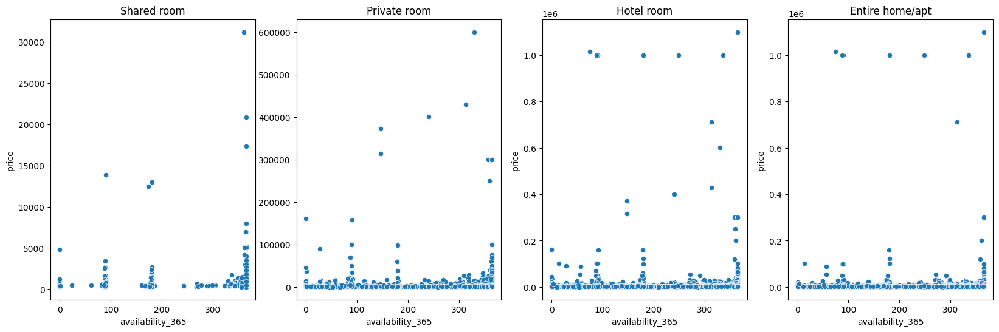

In [21]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 4, 4)
sns.scatterplot(y="price", x="availability_365", data=data[data['room_type'] == 'Entire home/apt'])
plt.title("Entire home/apt")

plt.subplot(1, 4, 3)
sns.scatterplot(y="price", x="availability_365", data=data[data['room_type'] != 'Hotel room'])
plt.title("Hotel room")

plt.subplot(1, 4, 2)
sns.scatterplot(y="price", x="availability_365", data=data[data['room_type'] == 'Private room'])
plt.title("Private room")

plt.subplot(1, 4, 1)
sns.scatterplot(y="price", x="availability_365", data=data[data['room_type'] == 'Shared room'])
plt.title("Shared room")


*** This also true for the availability of the room, making the data have correlation between the three  ***

In [22]:
data.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,No Review,0.00,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,No Review,0.00,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,No Review,0.00,3,365,0


In [23]:
display(data.describe(include='object'))

,name,host_name,neighbourhood,room_type,last_review
count,15852,15852,15852,15852,15852
unique,14800,5311,50,4,1670
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,No Review
freq,45,228,2152,8912,5789


In [24]:
#count the unique room type
data['room_type'].value_counts()

room_type
Entire home/apt    8912
Private room       5769
Hotel room          648
Shared room         523
Name: count, dtype: int64

<Axes: xlabel='room_type'>

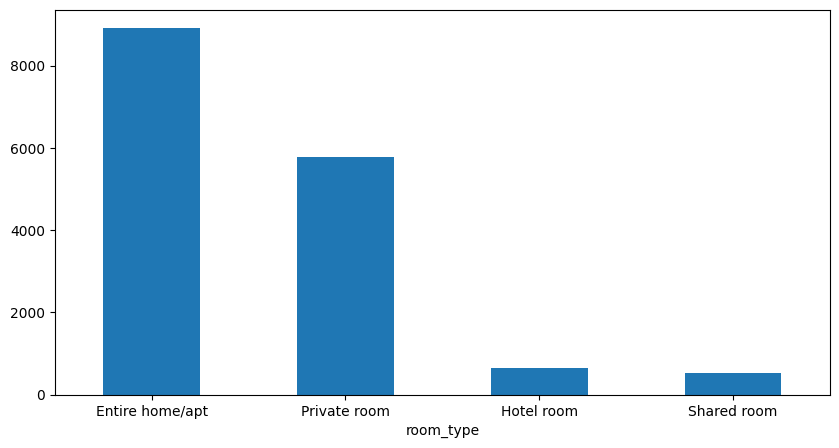

In [25]:
#Plot the unique room type 
data['room_type'].value_counts().plot(kind='bar', figsize=(10, 5), rot=0)

The bar chart highlights that the majority of listings are either entire Entire home/apt or Private rooms, with fewer shared rooms or hotel rooms. This distribution provides insight into the type of accommodation Airbnb users prefer in Bangkok.

In [26]:
#show the neighborhood with the most listings
data['neighbourhood'].value_counts()

neighbourhood
Vadhana                 2152
Khlong Toei             2097
Huai Khwang             1125
Ratchathewi             1114
Bang Rak                 827
Sathon                   809
Phra Nakhon              619
Phra Khanong             558
Chatu Chak               548
Bang Na                  458
Parthum Wan              455
Din Daeng                444
Phaya Thai               422
Suanluang                382
Khlong San               357
Bang Kapi                259
Bang Sue                 250
Bang Phlat               217
Yan na wa                200
Thon buri                182
Don Mueang               167
Pra Wet                  156
Phasi Charoen            155
Bangkok Noi              152
Lat Krabang              149
Bang Kho laen            140
Lak Si                   126
Pom Prap Sattru Phai     123
Bang Khen                116
Samphanthawong           114
Wang Thong Lang          100
Bang Khae                 92
Dusit                     91
Bangkok Yai               90


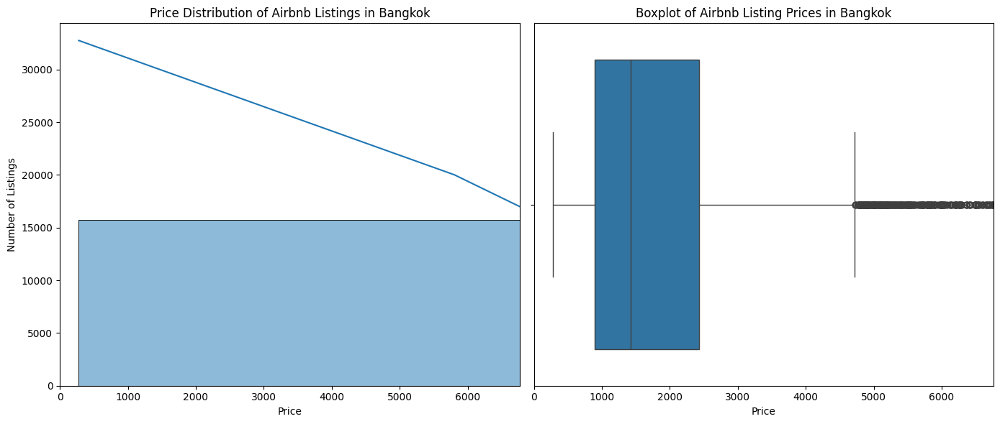

In [27]:
# Filter out rows with zero price
filtered_data = data[data['price'] > 0]

# Set up the plotting environment
plt.figure(figsize=(14, 6))

# Plot 1: Histogram 
plt.subplot(1, 2, 1)  
sns.histplot(filtered_data['price'], bins=50, kde=True)
plt.title("Price Distribution of Airbnb Listings in Bangkok")
plt.xlabel("Price")
plt.ylabel("Number of Listings")
#set the x limit to 95% of the maximum price so that we can see the most expensive listings
plt.xlim(0, filtered_data['price'].quantile(0.95)) 

# Plot 2 : Boxplot 
plt.subplot(1, 2, 2)  
sns.boxplot(x=filtered_data['price'])
plt.title("Boxplot of Airbnb Listing Prices in Bangkok")
plt.xlabel("Price")
plt.xlim(0, filtered_data['price'].quantile(0.95))  

plt.tight_layout()
plt.show()


The histogram show that most listings are priced below 10,000 per night, with a significant number around the 1,000 to 3,000 range. The plot also show the presence of outliers with prices far above the normal range, which could represent luxury properties or incorrectly entered data.

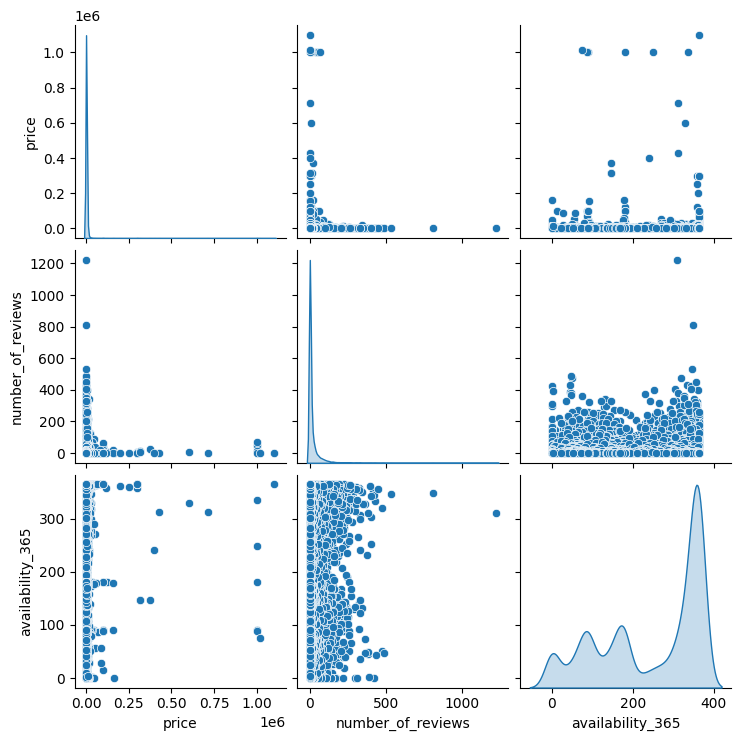

In [28]:
#show relationships between variables like price, number of reviews, and availability 

sns.pairplot(data[['price', 'number_of_reviews', 'availability_365']], diag_kind='kde')



*** Price and Number of reviews ***
For price and number of reviews there's a pattern, such as more expensive listings having fewer reviews or vice versa, it could suggest how pricing strategy impacts guest interest.

*** Price and Availability ***
price and availability have a trend might indicate whether more expensive properties are less frequently booked or whether cheaper properties are in higher demand.

*** Number of Reviews ***
This could show whether listings with more reviews are less available due to frequent bookings as shown from the above 1000 reviews.

In [29]:
#map centered around Bangkok coordinates
bangkok_map = folium.Map(location=[13.7563, 100.5018], zoom_start=12)
for index, row in data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7
    ).add_to(bangkok_map)

bangkok_map

The scatter plot shows that Airbnb listings are spread across Bangkok, with higher concentrations in certain areas. This suggests that some neighborhoods are more popular for short-term rentals, potentially due to tourist attractions or business.

In [30]:
#count the unique neighbourhood
data['neighbourhood'].value_counts()


neighbourhood
Vadhana                 2152
Khlong Toei             2097
Huai Khwang             1125
Ratchathewi             1114
Bang Rak                 827
Sathon                   809
Phra Nakhon              619
Phra Khanong             558
Chatu Chak               548
Bang Na                  458
Parthum Wan              455
Din Daeng                444
Phaya Thai               422
Suanluang                382
Khlong San               357
Bang Kapi                259
Bang Sue                 250
Bang Phlat               217
Yan na wa                200
Thon buri                182
Don Mueang               167
Pra Wet                  156
Phasi Charoen            155
Bangkok Noi              152
Lat Krabang              149
Bang Kho laen            140
Lak Si                   126
Pom Prap Sattru Phai     123
Bang Khen                116
Samphanthawong           114
Wang Thong Lang          100
Bang Khae                 92
Dusit                     91
Bangkok Yai               90


this shows that Vadhana is the most popular neighbourhood in Bangkok for airbnb listings, might be because of the high demand of airbnb in that area or because of the high number of listings in that area

In [31]:
#using the Mann-Whitney U test let compare the price between different neighbourhood from Vadhana and Khlong Toei

data_1 = data[data['neighbourhood'] == 'Vadhana']['price']
data_2 = data[data['neighbourhood'] == 'Khlong Toei']['price']

stat,p = mannwhitneyu(data_1, data_2, alternative='two-sided')

print(f"p = {p}")




p = 5.655261992953261e-16


p value is less than 0.05 so we reject the null hypothesis
There is a significant difference between the price between Vadhana and Khlong Toei, therefore the price between Vadhana and Khlong Toei is higher.

This proof that the price between Vadhana and Khlong Toei have a colleration that make them 2 of the most popular neighbourhood to have airbnb.

In [32]:
contingency_table = pd.crosstab(data['room_type'], data['neighbourhood'])
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"p = {p}")



p = 0.0


The use of chi2 test to determine if there is a relationship between room type and neighbourhood in Bangkok


from this test we could check if there a relationship between room type and neighbourhood in Bangkok, because p value is less than 0.05 it means that the probability of the data coming from a normal distribution is extremely low. In other words, the data significantly deviates from normality and test strongly suggests that the type of room listed on airbnb in Bangkok is not independent of the neighborhood. 


In [33]:
data.head(5)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,No Review,0.00,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,No Review,0.00,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,No Review,0.00,3,365,0


In [34]:
#save to csv to be used in tableau
if save == True:
    data.to_csv('Airbnb_Bangkok_updated.csv', index=False)